In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn import metrics
from scipy.optimize import minimize

from sklearn import set_config
import seaborn as sns
set_config("diagram")
from sklearn.tree import export_text
from sklearn.tree import plot_tree

from sklearn.decomposition import PCA

## Data Exploration (Preprocessing)

In [18]:
file_path = 'D:/Data/breast_cancer_wisconsin/wdbc.data'
columns = ["ID", "Diagnosis"] + [f"feature_{i}" for i in range(1, 31)]
df = pd.read_csv(file_path, header=None, names=columns)
df = df.dropna()
df.head()

,ID,Diagnosis,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,...,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [20]:
df.shape

(569, 32)

In [22]:
df['Diagnosis'].unique()

array(['M', 'B'], dtype=object)

## Data Visualization

In [13]:
#Pairwise plot
df_plot = df.drop(columns=["ID"])
df_plot["Diagnosis"] = df_plot["Diagnosis"].map({'B': "Benign", 'M': "Malignant"})

sns.pairplot(df_plot, hue = 'Diagnosis', corner=True)
plt.savefig('D:/PythonProject/Pictures/cancer2_pairplot.png', dpi = 300)
#plt.rcParams.update({'font.size': 15})
#plt.rcParams['font.family'] = 'Times New Roman'

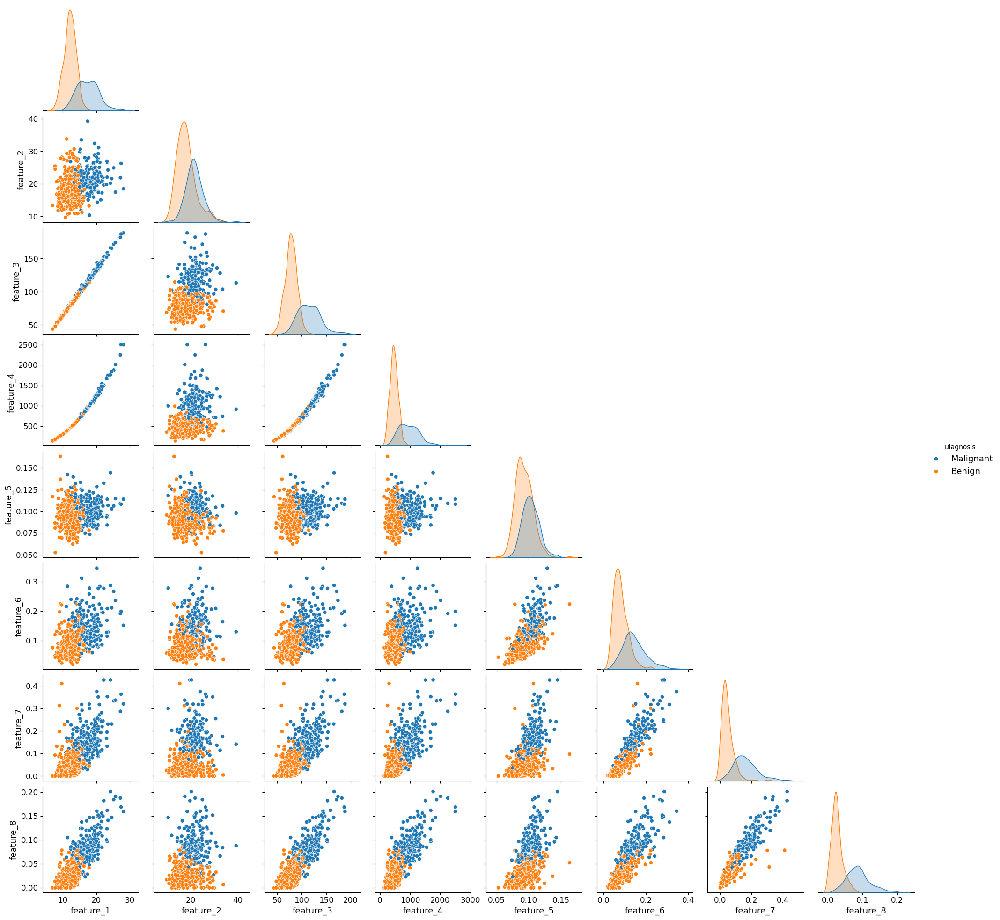

In [28]:
#Pairwise plot
df_selected = df.iloc[:, 1:10]
df_selected["Diagnosis"] = df_selected["Diagnosis"].map({'B': "Benign", 'M': "Malignant"})

sns.pairplot(df_selected, hue = 'Diagnosis', corner=True)
sns.set_context(rc={'axes.labelsize': 13, 'legend.fontsize':13, 
                    'xtick.labelsize': 12, 'ytick.labelsize': 12})
plt.savefig('D:/PythonProject/Pictures/cancer3_pairplot.png', dpi = 300)

==== Original Data ====
Precision: 0.9047619047619048, Recall: 0.9047619047619048, F1 Score: 0.9047619047619048
FP: 6, TP: 57, FPR: 0.05555555555555555, TPR: 0.9047619047619048
==== PCA (1 Component) ====
Precision: 0.9821428571428571, Recall: 0.873015873015873, F1 Score: 0.9243697478991597
FP: 1, TP: 55, FPR: 0.009259259259259259, TPR: 0.873015873015873
==== PCA (2 Component) ====
Precision: 0.9821428571428571, Recall: 0.873015873015873, F1 Score: 0.9243697478991597
FP: 1, TP: 55, FPR: 0.009259259259259259, TPR: 0.873015873015873


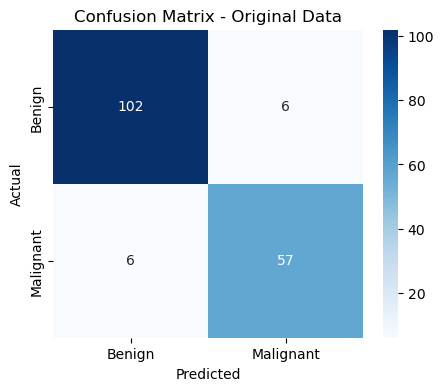

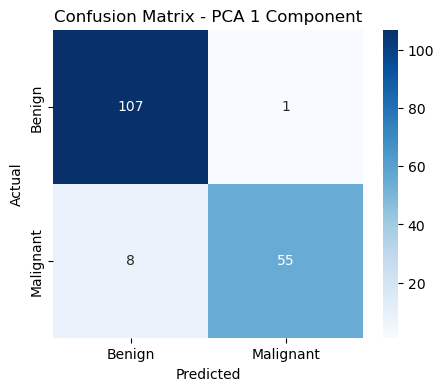

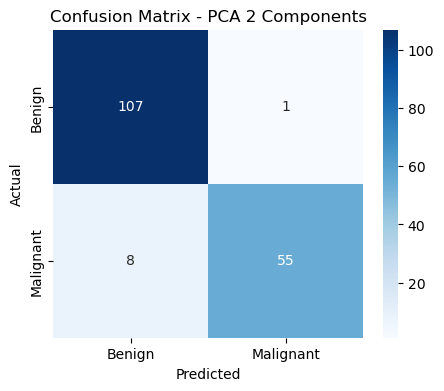

In [5]:
file_path = 'D:/Data/breast_cancer_wisconsin/wdbc.data'
columns = ["ID", "Diagnosis"] + [f"feature_{i}" for i in range(1, 31)]
df = pd.read_csv(file_path, header=None, names=columns)

df['Diagnosis'] = df['Diagnosis'].map({'M': 1, 'B': 0})
X = df.iloc[:, 2:].values  
y = df['Diagnosis'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf_original = DecisionTreeClassifier(max_depth=2, min_samples_split=5, min_samples_leaf=2, random_state=42)
clf_original.fit(X_train, y_train)
y_pred_original = clf_original.predict(X_test)

precision_original = precision_score(y_test, y_pred_original)
recall_original = recall_score(y_test, y_pred_original)
f1_original = f1_score(y_test, y_pred_original)
cm_original = confusion_matrix(y_test, y_pred_original)

pca_1 = PCA(n_components=1)
X_train_pca1 = pca_1.fit_transform(X_train)
X_test_pca1 = pca_1.transform(X_test)

clf_pca1 = DecisionTreeClassifier(max_depth=2, min_samples_split=5, min_samples_leaf=2, random_state=42)
clf_pca1.fit(X_train_pca1, y_train)
y_pred_pca1 = clf_pca1.predict(X_test_pca1)

precision_pca1 = precision_score(y_test, y_pred_pca1)
recall_pca1 = recall_score(y_test, y_pred_pca1)
f1_pca1 = f1_score(y_test, y_pred_pca1)
cm_pca1 = confusion_matrix(y_test, y_pred_pca1)

pca_2 = PCA(n_components=2)
X_train_pca2 = pca_2.fit_transform(X_train)
X_test_pca2 = pca_2.transform(X_test)

clf_pca2 = DecisionTreeClassifier(max_depth=2, min_samples_split=5, min_samples_leaf=2, random_state=42)
clf_pca2.fit(X_train_pca2, y_train)
y_pred_pca2 = clf_pca2.predict(X_test_pca2)

precision_pca2 = precision_score(y_test, y_pred_pca2)
recall_pca2 = recall_score(y_test, y_pred_pca2)
f1_pca2 = f1_score(y_test, y_pred_pca2)
cm_pca2 = confusion_matrix(y_test, y_pred_pca2)

def extract_metrics(cm):
    TN, FP, FN, TP = cm.ravel()
    FPR = FP / (FP + TN)
    TPR = TP / (TP + FN)
    return FP, TP, FPR, TPR

fp_original, tp_original, fpr_original, tpr_original = extract_metrics(cm_original)
fp_pca1, tp_pca1, fpr_pca1, tpr_pca1 = extract_metrics(cm_pca1)
fp_pca2, tp_pca2, fpr_pca2, tpr_pca2 = extract_metrics(cm_pca2)

print("==== Original Data ====")
print(f"Precision: {precision_original}, Recall: {recall_original}, F1 Score: {f1_original}")
print(f"FP: {fp_original}, TP: {tp_original}, FPR: {fpr_original}, TPR: {tpr_original}")

print("==== PCA (1 Component) ====")
print(f"Precision: {precision_pca1}, Recall: {recall_pca1}, F1 Score: {f1_pca1}")
print(f"FP: {fp_pca1}, TP: {tp_pca1}, FPR: {fpr_pca1}, TPR: {tpr_pca1}")

print("==== PCA (2 Component) ====")
print(f"Precision: {precision_pca2}, Recall: {recall_pca2}, F1 Score: {f1_pca2}")
print(f"FP: {fp_pca2}, TP: {tp_pca2}, FPR: {fpr_pca2}, TPR: {tpr_pca2}")

def plot_confusion_matrix(cm, title, filename):
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()
    
plot_confusion_matrix(cm_original, "Confusion Matrix - Original Data", "D:/PythonProject/Pictures/confusion_matrix_original.png")
plot_confusion_matrix(cm_pca1, "Confusion Matrix - PCA 1 Component", "D:/PythonProject/Pictures/confusion_matrix_pca1.png")
plot_confusion_matrix(cm_pca2, "Confusion Matrix - PCA 2 Components", "D:/PythonProject/Pictures/confusion_matrix_pca2.png")



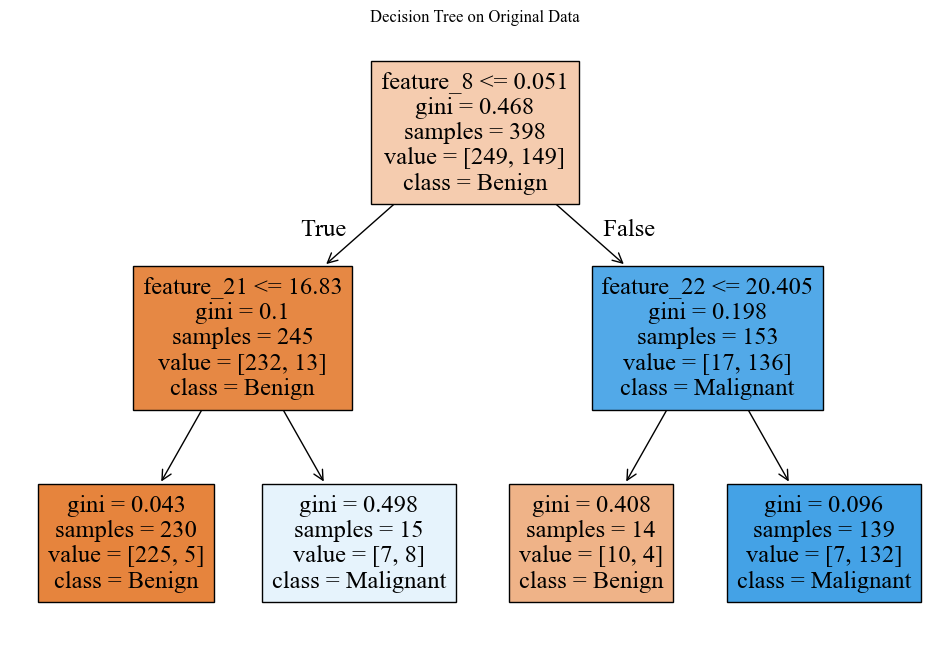

In [17]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.figure(figsize=(12, 8))
plot_tree(clf_original, feature_names=[f"feature_{i}" for i in range(1, 31)], class_names=["Benign", "Malignant"], filled=True)
plt.title("Decision Tree on Original Data")
plot_tree;
plt.savefig('D:/PythonProject/Pictures/treeplot3.png', dpi = 300)


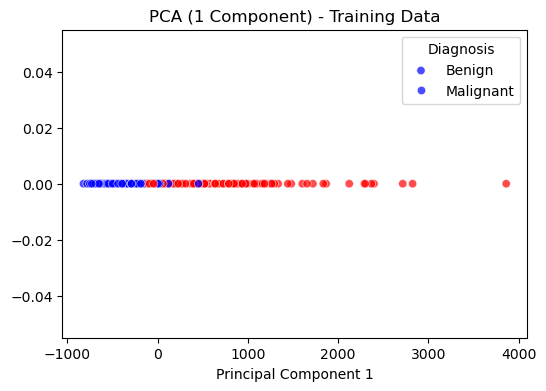

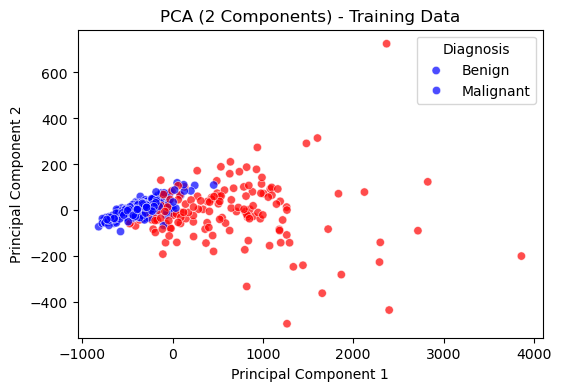

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
#sns.set_context(rc={'axes.labelsize': 10, 'legend.fontsize':10, 
#                    'xtick.labelsize': 10, 'ytick.labelsize': 10})

# Scatter plot for PCA with 1 component 
plt.figure(figsize=(6, 4))
sns.scatterplot(x=X_train_pca1[:, 0], y=[0] * len(X_train_pca1), hue=y_train, palette={0: 'blue', 1: 'red'}, alpha=0.7)
plt.xlabel("Principal Component 1")
plt.title("PCA (1 Component) - Training Data")
plt.legend(title="Diagnosis", labels=["Benign", "Malignant"])
plt.savefig('D:/PythonProject/Pictures/PCA_scatterplot1.png', dpi = 300)
plt.show()

# Scatter plot for PCA with 2 components 
plt.figure(figsize=(6, 4))
sns.scatterplot(x=X_train_pca2[:, 0], y=X_train_pca2[:, 1], hue=y_train, palette={0: 'blue', 1: 'red'}, alpha=0.7)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA (2 Components) - Training Data")
plt.legend(title="Diagnosis", labels=["Benign", "Malignant"])
plt.savefig('D:/PythonProject/Pictures/PCA_scatterplot2.png', dpi = 300)
plt.show()
